In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('cardio_train.csv', sep=';')
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [3]:
df = df.drop("id", axis=1)
df['age'] = round(df['age']/365.25, 2)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,50.36,2,168,62.0,110,80,1,1,0,0,1,0
1,55.38,1,156,85.0,140,90,3,1,0,0,1,1
2,51.63,1,165,64.0,130,70,3,1,0,0,0,1
3,48.25,2,169,82.0,150,100,1,1,0,0,1,1
4,47.84,1,156,56.0,100,60,1,1,0,0,0,0


In [4]:
df.isnull().sum()

age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          70000 non-null  float64
 1   gender       70000 non-null  int64  
 2   height       70000 non-null  int64  
 3   weight       70000 non-null  float64
 4   ap_hi        70000 non-null  int64  
 5   ap_lo        70000 non-null  int64  
 6   cholesterol  70000 non-null  int64  
 7   gluc         70000 non-null  int64  
 8   smoke        70000 non-null  int64  
 9   alco         70000 non-null  int64  
 10  active       70000 non-null  int64  
 11  cardio       70000 non-null  int64  
dtypes: float64(2), int64(10)
memory usage: 6.4 MB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,70000.0,53.302869,6.754974,29.56,48.36,53.94,58.39,64.92
gender,70000.0,1.349571,0.476838,1.00,1.00,1.00,2.00,2.00
height,70000.0,164.359229,8.210126,55.00,159.00,165.00,170.00,250.00
weight,70000.0,74.205690,14.395757,10.00,65.00,72.00,82.00,200.00
ap_hi,70000.0,128.817286,154.011419,-150.00,120.00,120.00,140.00,16020.00
ap_lo,70000.0,96.630414,188.472530,-70.00,80.00,80.00,90.00,11000.00
cholesterol,70000.0,1.366871,0.680250,1.00,1.00,1.00,2.00,3.00
gluc,70000.0,1.226457,0.572270,1.00,1.00,1.00,1.00,3.00
smoke,70000.0,0.088129,0.283484,0.00,0.00,0.00,0.00,1.00
alco,70000.0,0.053771,0.225568,0.00,0.00,0.00,0.00,1.00


<Axes: >

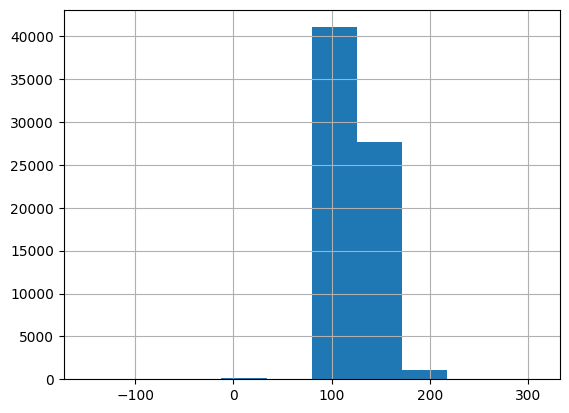

In [21]:
df['ap_hi'][df['ap_hi'] <= 370].hist(bins=10)

In [27]:
df_clean = df[df["ap_hi"] <= 370]

In [28]:
df_clean = df_clean[df_clean["ap_hi"] > 50]

In [29]:
df_clean = df_clean[df_clean["ap_lo"] >= 20]

In [32]:
df_clean = df_clean[df_clean['ap_lo'] <= 360]

In [33]:
df_clean.shape

(68795, 12)

<Axes: >

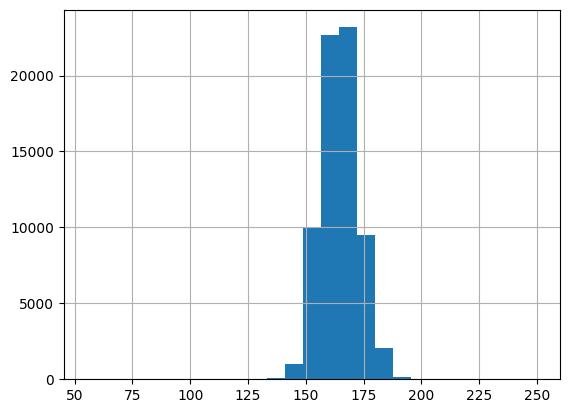

In [36]:
df_clean['height'].hist(bins=25)

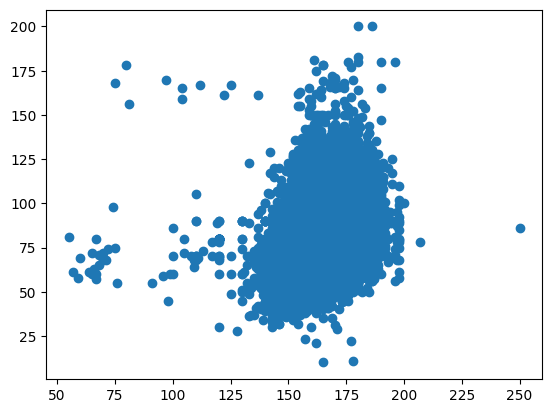

In [40]:
plt.scatter(x=df.height, y=df.weight)

have to account for people with dwarfism but the data in these ranges is not really sufficient, so anything below 125cm will be removed, anything above 210cm as well

as for the weight, anything below 35kg will be removed

In [45]:
df_clean = df_clean[df_clean['weight'] > 35]

In [47]:
df_clean = df_clean[df_clean['height'] > 100]

Gender should be 0 or 1, not 1 or 2

In [49]:
df_clean['gender'] = (df_clean['gender'] * -1) + 2

In [50]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
age,68746.0,53.290760,6.756516,29.56,48.34,53.94,58.38,64.92
gender,68746.0,0.651238,0.476582,0.00,0.00,1.00,1.00,1.00
height,68746.0,164.402802,7.969971,104.00,159.00,165.00,170.00,250.00
weight,68746.0,74.131904,14.295221,35.45,65.00,72.00,82.00,200.00
ap_hi,68746.0,126.619236,16.763680,60.00,120.00,120.00,140.00,240.00
ap_lo,68746.0,81.367818,9.725793,20.00,80.00,80.00,90.00,190.00
cholesterol,68746.0,1.364778,0.679013,1.00,1.00,1.00,2.00,3.00
gluc,68746.0,1.226050,0.572012,1.00,1.00,1.00,1.00,3.00
smoke,68746.0,0.087991,0.283283,0.00,0.00,0.00,0.00,1.00
alco,68746.0,0.053632,0.225292,0.00,0.00,0.00,0.00,1.00


In [131]:
df_clean.index = range(len(df_clean.index))

In [132]:
df_clean.iloc[220:228]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
220,53.87,1,164,57.0,120,80,2,1,0,0,1,0
221,48.16,1,157,70.0,160,100,3,1,0,0,0,1
222,54.29,1,158,83.0,130,80,1,2,0,0,1,1
223,41.88,1,165,70.0,160,90,1,1,0,0,1,1
224,47.83,1,156,65.0,120,80,1,1,0,0,1,0
225,43.33,0,166,70.0,110,70,1,1,1,0,1,0
226,39.35,1,168,68.0,120,79,1,1,0,0,1,1
227,55.47,0,169,65.0,130,80,1,1,0,0,0,0


In [133]:
X = df_clean.drop('cardio', axis=1)
y = df_clean['cardio']

In [134]:
X.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active'],
      dtype='object')

In [135]:
X.shape, y.shape

((68746, 11), (68746,))

In [136]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [137]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((54996, 11), (13750, 11), (54996,), (13750,))

In [56]:
from xgboost import XGBClassifier

In [57]:
model = XGBClassifier(tree_method='gpu_hist', gpu_id=0)

In [192]:
xgb_params = {
    'gamma': [2, 4, 5, 7],
    'colsample_bytree': [.7, .8, .9],
    'subsample': [.7, .8, .9],
    'max_depth': [3, 5, 6],
    'eta': [.2, .3, .4]
}

In [60]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(
    estimator=model,
    param_grid=xgb_params,
    scoring='roc_auc',
    n_jobs=15,
    cv=5,
    verbose=4
)

In [61]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV 2/5] END colsample_bytree=0.6, eta=0.3, gamma=0.5, max_depth=4, subsample=0.8;, score=0.795 total time=  43.0s
[CV 5/5] END colsample_bytree=0.6, eta=0.3, gamma=0.5, max_depth=5, subsample=0.6;, score=0.804 total time=   7.4s
[CV 3/5] END colsample_bytree=0.6, eta=0.3, gamma=0.5, max_depth=7, subsample=1;, score=0.792 total time=   6.5s
[CV 4/5] END colsample_bytree=0.6, eta=0.3, gamma=1, max_depth=4, subsample=0.6;, score=0.800 total time=   5.2s
[CV 4/5] END colsample_bytree=0.6, eta=0.3, gamma=1, max_depth=5, subsample=0.6;, score=0.799 total time=   6.8s
[CV 4/5] END colsample_bytree=0.6, eta=0.3, gamma=1, max_depth=7, subsample=0.6;, score=0.787 total time=   8.3s
[CV 5/5] END colsample_bytree=0.6, eta=0.3, gamma=5, max_depth=4, subsample=0.8;, score=0.806 total time=   3.7s
[CV 5/5] END colsample_bytree=0.6, eta=0.3, gamma=5, max_depth=5, subsample=0.8;, score=0.806 total time=   4.1s
[CV 1/5] END colsample_bytre

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None, gpu_id=0,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=15,
             param_grid={'colsample_bytree': [0.6, 0.8, 1],
                         'eta': [0.3, 0.5, 0.7], 'gamma': [0.5, 1, 5],
                         'max_depth': [4, 5, 7], 'subsample': [0.6, 0.8, 1]},
             scoring='roc_auc', verbose=4)

[CV 3/5] END colsample_bytree=1, eta=0.7, gamma=0.5, max_depth=5, subsample=0.6;, score=0.767 total time=   7.7s
[CV 3/5] END colsample_bytree=1, eta=0.7, gamma=0.5, max_depth=7, subsample=1;, score=0.786 total time=   9.3s
[CV 4/5] END colsample_bytree=1, eta=0.7, gamma=1, max_depth=4, subsample=1;, score=0.800 total time=   3.5s
[CV 4/5] END colsample_bytree=1, eta=0.7, gamma=1, max_depth=5, subsample=0.8;, score=0.778 total time=  11.7s
[CV 5/5] END colsample_bytree=1, eta=0.7, gamma=1, max_depth=7, subsample=1;, score=0.798 total time=   4.0s
[CV 3/5] END colsample_bytree=1, eta=0.7, gamma=5, max_depth=4, subsample=1;, score=0.791 total time=   3.1s
[CV 1/5] END colsample_bytree=1, eta=0.7, gamma=5, max_depth=5, subsample=1;, score=0.798 total time=   5.6s
[CV 3/5] END colsample_bytree=1, eta=0.7, gamma=0.5, max_depth=4, subsample=0.8;, score=0.781 total time=   7.9s
[CV 5/5] END colsample_bytree=1, eta=0.7, gamma=0.5, max_depth=5, subsample=1;, score=0.799 total time=   4.4s
[CV 2

In [62]:
grid.best_params_

{'colsample_bytree': 0.8,
 'eta': 0.3,
 'gamma': 5,
 'max_depth': 5,
 'subsample': 0.8}

In [138]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X1 = X.copy()
y1 = y.copy()

scaler.fit(X1)
X1_scaled = scaler.transform(X1)

pca_8 = PCA(
    n_components=8
)

pca_8.fit(X1_scaled)
X_pca8 = pca_8.transform(X1_scaled)

In [139]:
np.cumsum(pca_8.explained_variance_ratio_)

array([0.1994295 , 0.36959207, 0.48670115, 0.58730128, 0.67721348,
       0.75902514, 0.8283489 , 0.88464725])

In [140]:
X_train.shape

(54996, 11)

[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221]
0.6772134838457606
[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221 0.08181166]
0.7590251438189279
[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221 0.08181166
 0.06932376]
0.8283489048408409
[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221 0.08181166
 0.06932376 0.05629834]
0.8846472479544021
[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221 0.08181166
 0.06932376 0.05629834 0.04877032]
0.9334175641926944
[0.1994295  0.17016257 0.11710908 0.10060013 0.08991221 0.08181166
 0.06932376 0.05629834 0.04877032 0.03914516 0.02743728]
1.0000000000000002


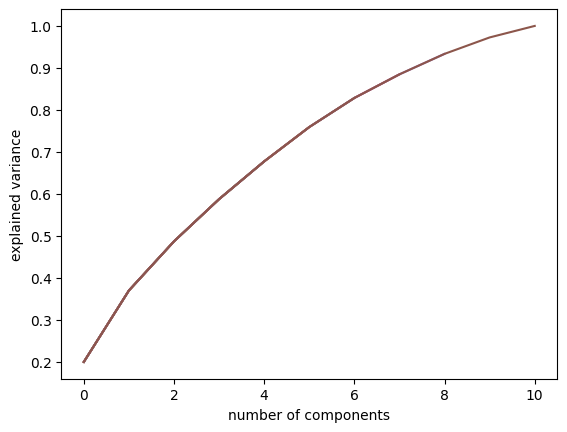

In [141]:
plt.figure()
for x in [5, 6, 7, 8, 9, 11]:
    pca = PCA(n_components=x)
    pca.fit(X1_scaled)
    X_pca = pca.transform(X1_scaled)
    print(pca.explained_variance_ratio_)
    print(np.cumsum(pca.explained_variance_ratio_)[-1])
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('explained variance')
plt.show();

In [142]:
X_train_pca = pd.DataFrame(X_pca8, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7', 'PC8'])

In [143]:
X_train_pca.head(3)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-0.794466,1.279331,0.166251,-0.315007,-0.615324,-0.408143,-0.928790,-0.657566
1,1.154018,-2.058747,-0.321928,0.390837,-0.489441,0.432318,0.402657,0.568725
2,-0.490148,-0.914099,-1.222668,-0.821597,1.810505,0.346663,-0.340559,0.004001


In [144]:
df_pca = pd.concat([X_train_pca, y], axis=1)

In [145]:
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,cardio
0,-0.794466,1.279331,0.166251,-0.315007,-0.615324,-0.408143,-0.928790,-0.657566,0
1,1.154018,-2.058747,-0.321928,0.390837,-0.489441,0.432318,0.402657,0.568725,1
2,-0.490148,-0.914099,-1.222668,-0.821597,1.810505,0.346663,-0.340559,0.004001,1
3,1.862909,0.426276,1.812677,-0.200712,-0.761078,0.724643,-0.873740,-0.474023,1
4,-3.285912,0.242122,-0.701506,-0.425503,2.004102,0.302248,-0.044803,0.142020,0


In [146]:
df_pca['cardio'].value_counts()

0    34718
1    34028
Name: cardio, dtype: int64

In [148]:
X_pca8.shape, y.shape

((68746, 8), (68746,))

In [153]:
df_pca['cardio'] = df_pca['cardio'].astype("int32")

In [154]:
df_pca.head(3)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,cardio
0,-0.794466,1.279331,0.166251,-0.315007,-0.615324,-0.408143,-0.928790,-0.657566,0
1,1.154018,-2.058747,-0.321928,0.390837,-0.489441,0.432318,0.402657,0.568725,1
2,-0.490148,-0.914099,-1.222668,-0.821597,1.810505,0.346663,-0.340559,0.004001,1


In [160]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [186]:
loadings = pca.components_.T
df_loadings = pd.DataFrame(loadings,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11'], index=X.columns)
df_loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
age,0.180308,-0.264715,0.002724,0.087065,0.111565,-0.902238,0.225763,-0.000794,0.062057,0.075300,0.053455
gender,-0.286167,-0.475618,0.019117,0.152585,0.035388,0.252891,0.373129,0.172023,0.067609,0.655183,-0.019734
height,0.263141,0.453569,0.028350,-0.430831,-0.125641,-0.093454,-0.026661,-0.246910,-0.044566,0.669982,-0.039438
weight,0.394269,0.056640,0.063922,-0.351926,-0.101151,0.174798,0.698480,0.336330,0.054552,-0.259143,0.038696
ap_hi,0.485259,-0.253245,0.337793,0.151587,0.013173,0.106361,-0.171786,-0.029688,0.023446,0.022665,-0.721364
ap_lo,0.472264,-0.227389,0.363874,0.158630,0.007263,0.177203,-0.213200,-0.090175,0.063542,0.084074,0.686693
cholesterol,0.279352,-0.293539,-0.532724,-0.066493,-0.030126,0.063041,-0.087096,0.033569,-0.729192,0.034277,0.033021
gluc,0.214655,-0.243310,-0.609129,-0.179427,-0.033164,0.094015,-0.166406,-0.105521,0.665207,-0.004411,-0.014417
smoke,0.212541,0.396309,-0.201745,0.408508,0.148466,-0.035916,-0.167836,0.700828,0.085093,0.200300,0.012819
alco,0.181958,0.275902,-0.225163,0.558957,0.206860,0.139111,0.425615,-0.532811,-0.001077,-0.011638,-0.017975


In [163]:
import plotly.express as px

In [164]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.1994295 , 0.17016257, 0.11710908, 0.10060013, 0.08991221,
       0.08181166, 0.06932376, 0.05629834, 0.04877032, 0.03914516,
       0.02743728])

In [165]:
explained_variance = np.insert(explained_variance, 0, 0)
explained_variance

array([0.        , 0.1994295 , 0.17016257, 0.11710908, 0.10060013,
       0.08991221, 0.08181166, 0.06932376, 0.05629834, 0.04877032,
       0.03914516, 0.02743728])

In [167]:
cumulative_variance = np.cumsum(np.round(explained_variance, decimals=3))
cumulative_variance

array([0.   , 0.199, 0.369, 0.486, 0.587, 0.677, 0.759, 0.828, 0.884,
       0.933, 0.972, 0.999])

In [170]:
pc_df = pd.DataFrame(['','PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11'], columns=['PC'])
explained_variance_df = pd.DataFrame(explained_variance, columns=['explained_variance'])
cumulative_variance_df = pd.DataFrame(cumulative_variance, columns=['cumulative_variance'])

In [171]:
df_explained_variance = pd.concat([pc_df, explained_variance_df, cumulative_variance_df], axis=1)
df_explained_variance

,PC,explained_variance,cumulative_variance
0,,0.000000,0.000
1,PC1,0.199430,0.199
2,PC2,0.170163,0.369
3,PC3,0.117109,0.486
4,PC4,0.100600,0.587
5,PC5,0.089912,0.677
6,PC6,0.081812,0.759
7,PC7,0.069324,0.828
8,PC8,0.056298,0.884
9,PC9,0.048770,0.933


In [175]:
fig = px.bar(df_explained_variance,
             x='PC',
             y='explained_variance',
             text='explained_variance',
             width=800, height=400)

fig.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig.show()

In [178]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_explained_variance['PC'],
        y=df_explained_variance['cumulative_variance'],
        marker=dict(size=15, color='LightSeaGreen')
    )
)
fig.add_trace(
    go.Bar(
        x=df_explained_variance['PC'],
        y=df_explained_variance['explained_variance'],
        marker=dict(color='RoyalBlue')
    )
)
fig.update_layout(
    width=800,
    height=600
)
fig.show()

In [180]:
fig = px.scatter_3d(df_pca[['PC1','PC2','PC3','cardio']], x='PC1', y='PC2', z='PC3', color='cardio')

fig.show()

In [188]:
loadings_label = df_loadings.index

fig = px.scatter_3d(df_loadings, x='PC1', y='PC2', z='PC3', text=loadings_label)
fig.show()

In [187]:
df_loadings.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11'],
      dtype='object')

In [189]:
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,cardio
0,-0.794466,1.279331,0.166251,-0.315007,-0.615324,-0.408143,-0.928790,-0.657566,0
1,1.154018,-2.058747,-0.321928,0.390837,-0.489441,0.432318,0.402657,0.568725,1
2,-0.490148,-0.914099,-1.222668,-0.821597,1.810505,0.346663,-0.340559,0.004001,1
3,1.862909,0.426276,1.812677,-0.200712,-0.761078,0.724643,-0.873740,-0.474023,1
4,-3.285912,0.242122,-0.701506,-0.425503,2.004102,0.302248,-0.044803,0.142020,0
...,...,...,...,...,...,...,...,...,...
68741,0.693330,2.491832,-0.280878,0.902714,-0.144125,-0.610095,-0.862155,2.127803,0
68742,2.488176,-2.030198,-0.409191,-0.858634,-0.717363,0.113735,2.453833,1.236718,1
68743,5.076820,1.250090,-0.258829,0.142580,2.144209,1.329298,1.777037,-2.589015,1
68744,0.108219,-1.249481,-0.210948,-0.693914,1.989070,-0.645454,0.078990,-0.131892,1


In [191]:
X_pca = df_pca.drop('cardio', axis=1)
y_pca = df_pca['cardio']

In [193]:
grid_pca = GridSearchCV(
    estimator=model,
    param_grid=xgb_params,
    scoring='roc_auc',
    n_jobs=15,
    cv=5,
    verbose=4
)

In [194]:
grid_pca.fit(X_pca, y_pca)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 2/5] END colsample_bytree=0.7, eta=0.2, gamma=2, max_depth=3, subsample=0.7;, score=0.796 total time=  10.7s
[CV 2/5] END colsample_bytree=0.7, eta=0.2, gamma=2, max_depth=5, subsample=0.9;, score=0.796 total time=   7.1s
[CV 3/5] END colsample_bytree=0.7, eta=0.2, gamma=2, max_depth=6, subsample=0.9;, score=0.789 total time=   9.1s
[CV 4/5] END colsample_bytree=0.7, eta=0.2, gamma=4, max_depth=3, subsample=0.9;, score=0.789 total time=   3.4s
[CV 3/5] END colsample_bytree=0.7, eta=0.2, gamma=4, max_depth=5, subsample=0.9;, score=0.790 total time=   5.0s
[CV 4/5] END colsample_bytree=0.7, eta=0.2, gamma=4, max_depth=6, subsample=0.9;, score=0.790 total time=   6.8s
[CV 3/5] END colsample_bytree=0.7, eta=0.2, gamma=5, max_depth=3, subsample=0.9;, score=0.790 total time=   4.6s
[CV 3/5] END colsample_bytree=0.7, eta=0.2, gamma=5, max_depth=5, subsample=0.9;, score=0.790 total time=   6.7s
[CV 4/5] END colsample_bytree=0.

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


1 fits failed out of a total of 1620.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/xgboost/core.py", line 620, in inner_f
    return func(**kwargs)
  File "/usr/local/lib/python3.8/dist-packages/xgboost/sklearn.py", line 1490, in fit
    self._Booster = train(
  File "/usr/local/lib/python3.8/dist-packages/xgboost/core.py", line 620, in inner_f
    re

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None, gpu_id=0,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=15,
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'eta': [0.2, 0.3, 0.4], 'gamma': [2, 4, 5, 7],
                         'max_depth': [3, 5, 6], 'subsample': [0.7, 0.8, 0.9]},
             scoring='roc_auc', verbose=4)

[CV 2/5] END colsample_bytree=0.8, eta=0.4, gamma=7, max_depth=5, subsample=0.9;, score=0.793 total time=   4.2s
[CV 1/5] END colsample_bytree=0.8, eta=0.4, gamma=7, max_depth=6, subsample=0.9;, score=0.782 total time=   4.7s
[CV 3/5] END colsample_bytree=0.9, eta=0.2, gamma=2, max_depth=3, subsample=0.9;, score=0.791 total time=   4.6s
[CV 2/5] END colsample_bytree=0.9, eta=0.2, gamma=2, max_depth=5, subsample=0.9;, score=0.796 total time=   6.7s
[CV 5/5] END colsample_bytree=0.9, eta=0.2, gamma=2, max_depth=6, subsample=0.8;, score=0.782 total time=   9.5s
[CV 2/5] END colsample_bytree=0.9, eta=0.2, gamma=4, max_depth=3, subsample=0.9;, score=0.794 total time=   5.1s
[CV 4/5] END colsample_bytree=0.9, eta=0.2, gamma=4, max_depth=5, subsample=0.9;, score=0.791 total time=   5.0s
[CV 4/5] END colsample_bytree=0.9, eta=0.2, gamma=4, max_depth=6, subsample=0.9;, score=0.790 total time=   5.5s
[CV 4/5] END colsample_bytree=0.9, eta=0.2, gamma=5, max_depth=3, subsample=0.9;, score=0.789 to

In [196]:
grid_pca.best_params_

{'colsample_bytree': 0.8,
 'eta': 0.2,
 'gamma': 4,
 'max_depth': 6,
 'subsample': 0.9}

In [197]:
grid_pca.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=4, gpu_id=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, ...)

In [198]:
xgb_pca = grid_pca.best_estimator_

In [199]:
Xp_train, Xp_test, yp_train, yp_test = train_test_split(X_pca, y_pca, test_size=0.2, random_state=42)

In [200]:
xgb_pca.fit(Xp_train, yp_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=4, gpu_id=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, ...)

In [209]:
preds_pca = xgb_pca.predict(Xp_test)

In [210]:
train_preds_pca = xgb_pca.predict(Xp_train)

In [205]:
from sklearn.metrics import precision_score, recall_score, accuracy_score

def eval_preds(y_preds, y_true, cat="Testing"):
    res_acc = accuracy_score(y_true, y_preds)
    res_prec = precision_score(y_true, y_preds)
    res_recall = recall_score(y_true, y_preds)
    print(f"{cat} data performance:\nAccuracy: {res_acc}\nPrecision: {res_prec}\nRecall: {res_recall}\n")
    return res_acc, res_prec, res_recall

In [211]:
eval_preds(train_preds_pca, yp_train, "Training")
eval_preds(preds_pca, yp_test)

Training data performance:
Accuracy: 0.7383264237399083
Precision: 0.7507755545214828
Recall: 0.7085452881976212

Testing data performance:
Accuracy: 0.7274909090909091
Precision: 0.7337128399746996
Recall: 0.6922273608831866



(0.7274909090909091, 0.7337128399746996, 0.6922273608831866)

In [218]:
xgb = grid.best_estimator_

In [219]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eta=0.3, eval_metric=None,
              feature_types=None, gamma=5, gpu_id=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, ...)

In [220]:
preds = xgb.predict(X_test)
train_preds = xgb.predict(X_train)

In [221]:
eval_preds(train_preds, y_train, 'Training')
eval_preds(preds, y_test)

Training data performance:
Accuracy: 0.7374718161320823
Precision: 0.7611347517730497
Recall: 0.6873193046660567

Testing data performance:
Accuracy: 0.736
Precision: 0.7539249710791605
Recall: 0.6805907802476503



(0.736, 0.7539249710791605, 0.6805907802476503)

In [217]:
eval_preds(train_preds, y_train, 'Training')
eval_preds(preds, y_test)

Training data performance:
Accuracy: 0.7414357407811477
Precision: 0.7645871189178276
Recall: 0.6929551692589204

Testing data performance:
Accuracy: 0.7366545454545455
Precision: 0.7534539473684211
Recall: 0.6834253319409219



(0.7366545454545455, 0.7534539473684211, 0.6834253319409219)